<a href="https://colab.research.google.com/github/sabrinafrazao/Visao-Computacional/blob/main/Processamento_de_imagens_com_o_Pillow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Curso Introdução à visão computacional e ao processamento de imagens IBM

# **Processamento de imagens com o Pillow**

# Download the images for the lab:

In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png

--2024-02-14 19:08:23--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 473831 (463K) [image/png]
Saving to: ‘lenna.png’

lenna.png           100%[===================>] 462.73K  2.62MB/s    in 0.2s    

2024-02-14 19:08:23 (2.62 MB/s) - ‘lenna.png’ saved [473831/473831]

--2024-02-14 19:08:24--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-cours

In [2]:
def get_concat_h(im1, im2):
  dst = Image.new('RGB', (im1.width + im2.width, im1.height))
  dst.paste(im1, (0,0))
  dst.paste(im2, (im1.width, 0))
  return dst


# Image Files and Paths

In [3]:
my_image = 'lenna.png'

In [4]:
# Encontrar o caminho do  diretório de trabalho atual com o módulo 'os' do Python.

import os
cwd = os.getcwd()
cwd

'/content'

In [5]:
# O caminho também pode ser encontrado usado a seguinte linha de comando
image_path = os.path.join(cwd, my_image)
image_path

'/content/lenna.png'

# Load Images in Python

In [6]:
from PIL import Image

In [7]:
#Se a imagem estiver no diretório de trabalho atual, você poderá
#carregá-la da seguinte maneira usando o nome do arquivo da imagem e criar um objeto de imagem PIL

image = Image.open(my_image)
type(image)

PIL.PngImagePlugin.PngImageFile

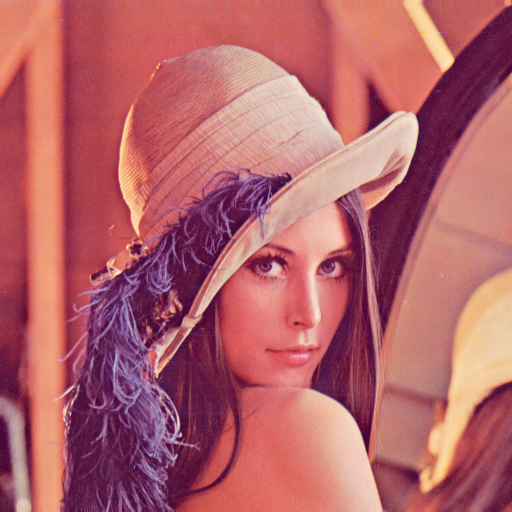

In [8]:
# estiver trabalhando em um ambiente Jupyter, poderá visualizar a imagem chamando a própria variável.
image

# Plotting an Image

In [13]:
#  usar o método show de objetos PIL para exibir a imagem, depende dá configuração, no caso esse aqui não pega rs
image.show()

In [14]:
# usar o método imshow da biblioteca matplotlib para exibir a imagem.
import matplotlib.pyplot as plt

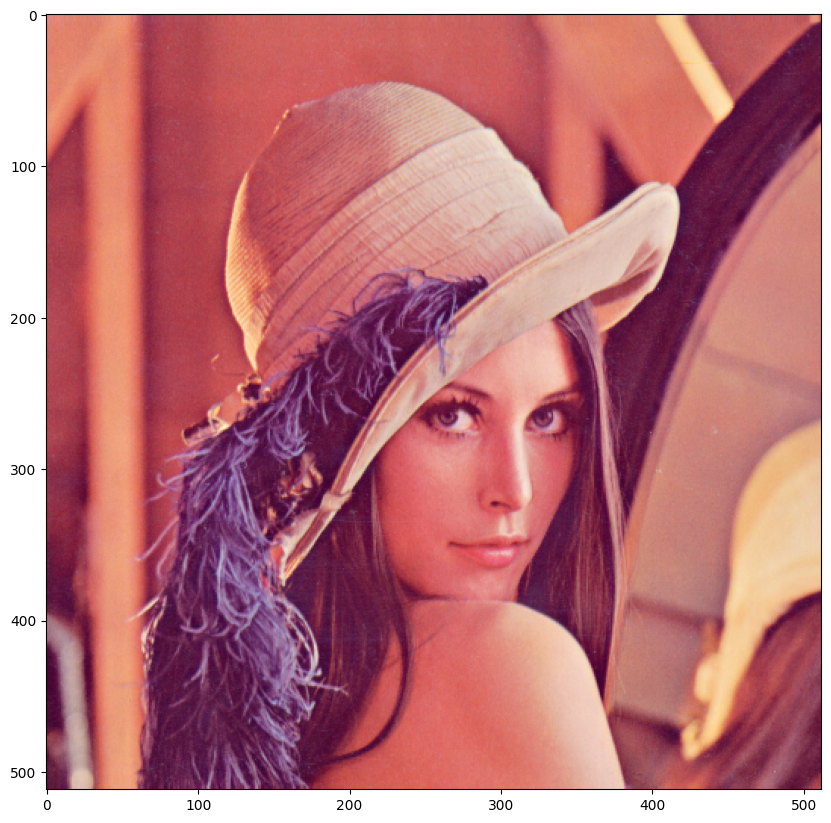

In [17]:
plt.figure(figsize=(10,20))
plt.imshow(image)
plt.show()

In [18]:
# carregar a imagem usando seu caminho completo. Isso é útil se a imagem não estiver no seu diretório de trabalho.
image = Image.open(image_path)

In [19]:
# O formato da imagem, quantidade de pixel
print(image.size)

(512, 512)


In [20]:
# Especifica o formato de pixel usado. Neste caso, é “RGB”.
print(image.mode)

RGB


In [21]:
# O método Image.open não carrega dados de imagem na memória do computador.
# O método load do objeto PIL lê o conteúdo do arquivo, decodifica-o e expande a imagem na memória
im = image.load()

In [22]:
# verificar a intensidade da imagem em 𝑥 -ésima coluna e 𝑦 - éssima linha:
x = 0
y = 1
im[y,x]

(226, 137, 125)

In [23]:
# salvar a imagem no formato jpg
image.save("lenna.jpg")

# Grayscale Images, Quantization and Color Channels

Grayscale Images

In [24]:
# O módulo ImageOps contém várias operações de processamento de imagem ‘prontas’.
# Este módulo é um tanto experimental e a maioria dos operadores só trabalha com
# imagens em tons de cinza e/ou RGB.

from PIL import ImageOps

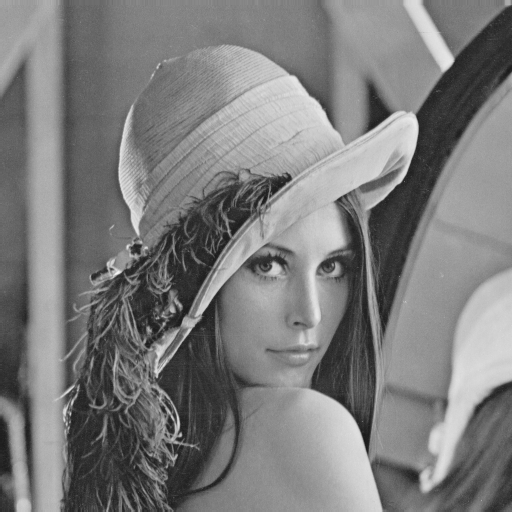

In [25]:
# imagem em tons de cinza
image_gray = ImageOps.grayscale(image)
image_gray

In [26]:
# image_gray.mode retornando "L" indica que a imagem em questão está no modo de
#  escala de cinza, onde cada pixel é representado por um valor de intensidade luminosa

# o valor "L" é frequentemente usado para indicar o modo "Luminance" (luminosidade),
# que se refere à intensidade da luz ou cor em cada pixel

image_gray.mode

'L'

Quantization

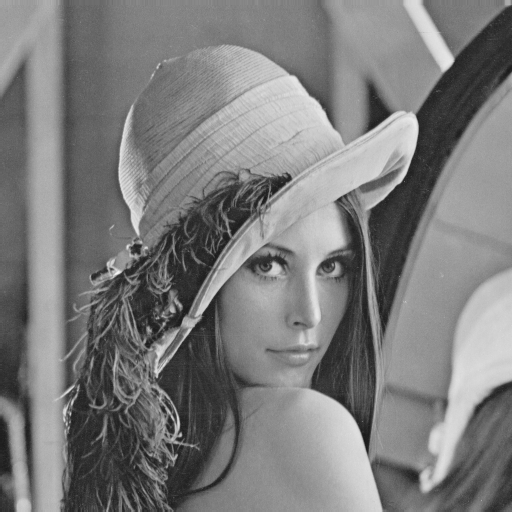

In [27]:
# A quantização de uma imagem é o número de valores de intensidade únicos que
# qualquer pixel da imagem pode assumir.

# Metade dos níveis não faz diferença perceptível
image_gray.quantize(256 // 2)
image_gray


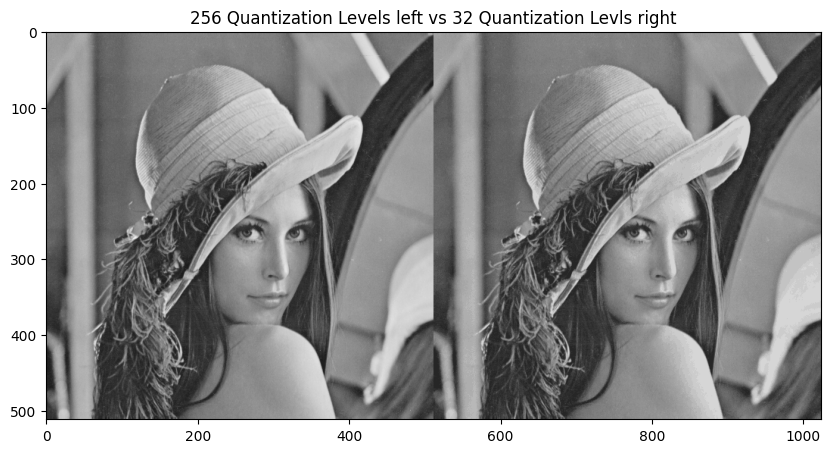

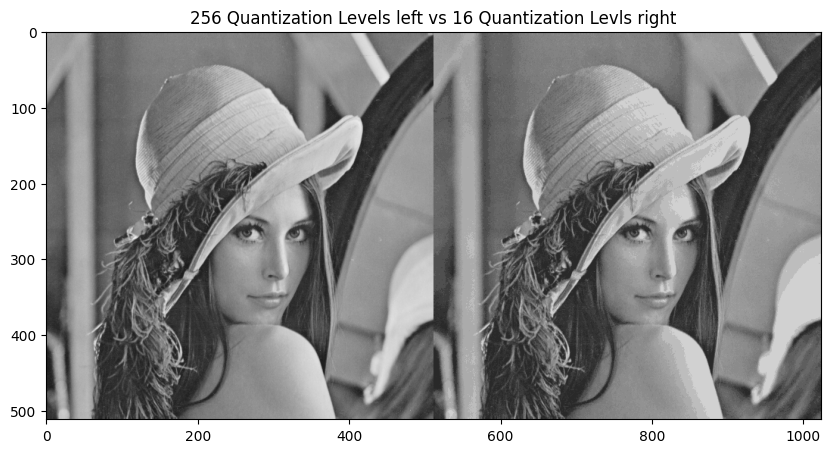

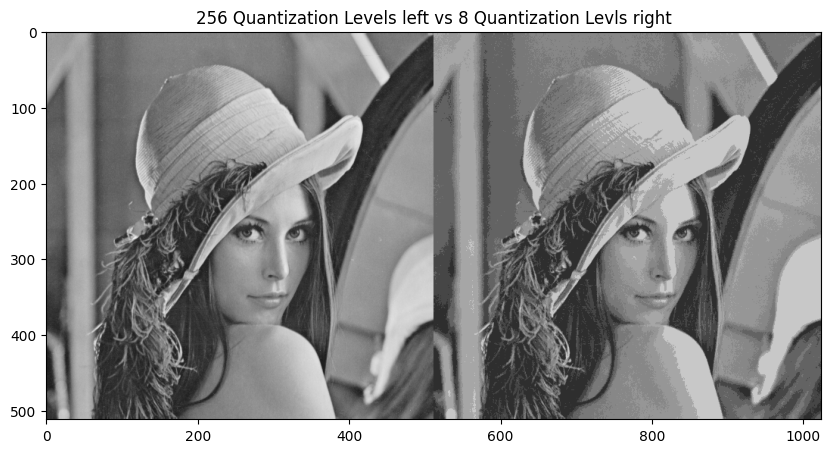

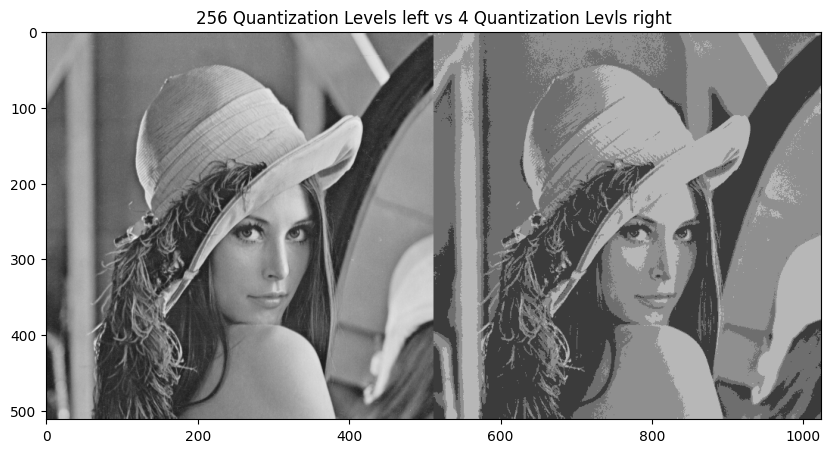

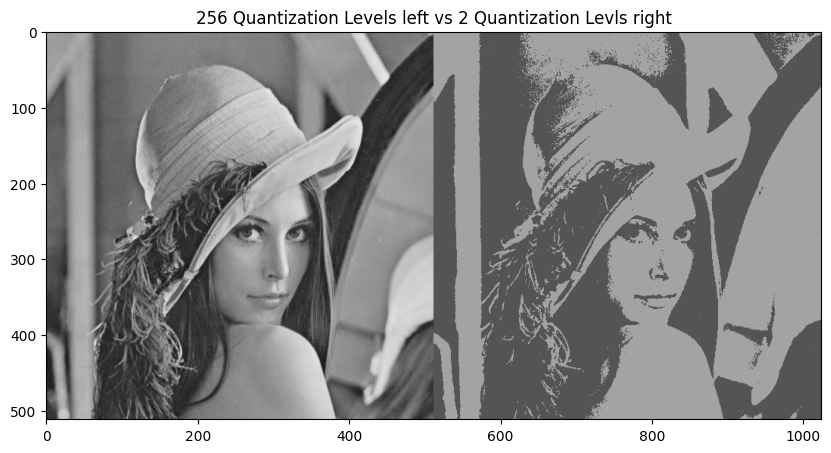

In [30]:
# continuar a divisão
# Comparar a imagem dividida por 2 com a original

for n in range(3,8):
  plt.figure(figsize=(10,10))

  plt.imshow(get_concat_h(image_gray, image_gray.quantize(256//2**n)))
  plt.title("256 Quantization Levels left vs {} Quantization Levls right" .format(256//2**n))

 Color Channels

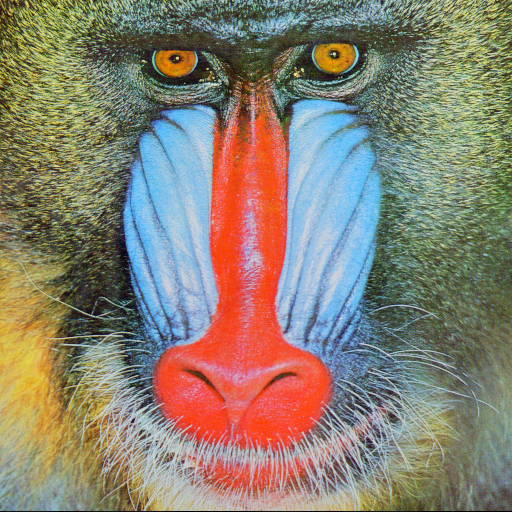

In [31]:
# Abrindo a imagem
baboon = Image.open('baboon.png')
baboon

In [32]:
# Dividindo uma imagem em seus componentes de cor individuais
red, green, blue = baboon.split()

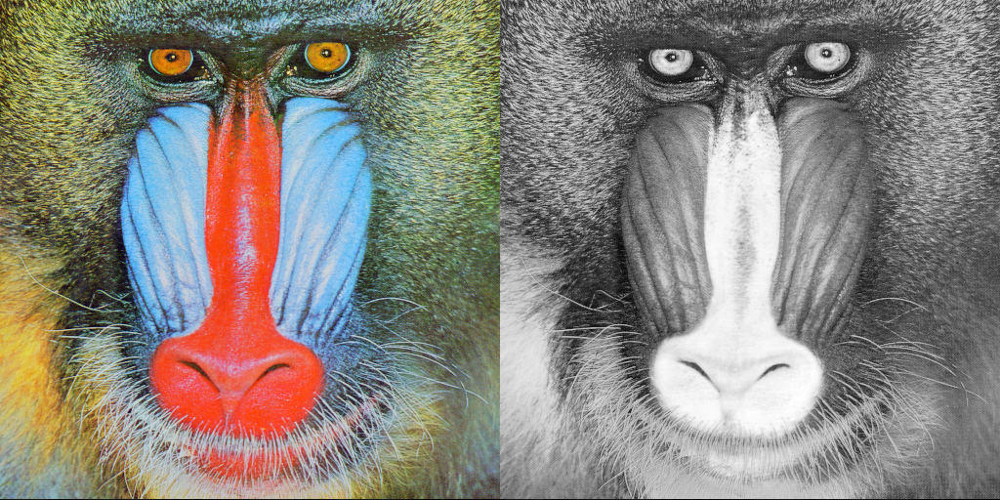

In [33]:
get_concat_h(baboon, red)

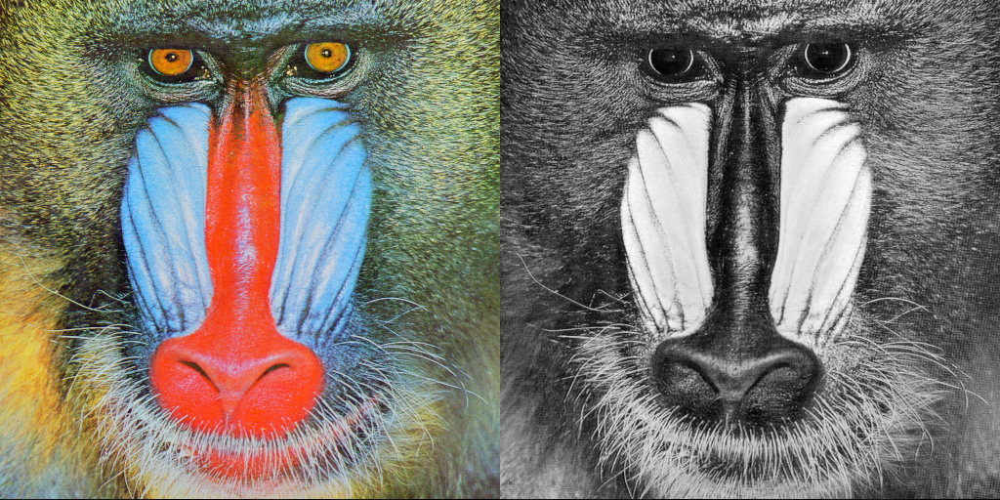

In [34]:
get_concat_h(baboon, blue)

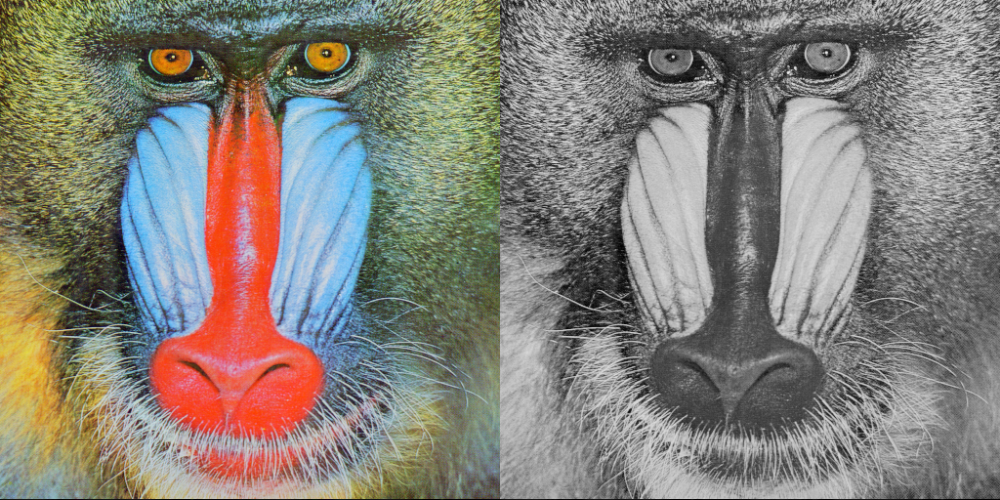

In [35]:
get_concat_h(baboon, green)

# PIL Images into NumPy Arrays

In [36]:
import numpy as np

In [37]:
# Obtendo uma numpy array
array= np.asarray(image)
print(type(array))

<class 'numpy.ndarray'>


In [38]:
# O método np.array cria uma nova cópia da imagem, de forma que a original permaneça inalterada.
array = np.array(image)

In [39]:
# Dimeções da imegem e os canais de cores
print(array.shape)

(512, 512, 3)


In [40]:
# Visualizar os valores de intensidade imprimindo o array, eles variam de 0 a 255 ou 28 2 8 (8 bits)
print(array)

[[[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 ...

 [[ 84  18  60]
  [ 84  18  60]
  [ 92  27  58]
  ...
  [173  73  84]
  [172  68  76]
  [177  62  79]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]]


In [41]:
# Os valores de intensidade são tipos de dados não assinados de 8 bits.
array[0,0]

array([226, 137, 125], dtype=uint8)

In [42]:
# Encontrar o valor de intensidade máximo e mínimo do array:
array.min()

3

In [43]:
array.max()

255

# Indexing

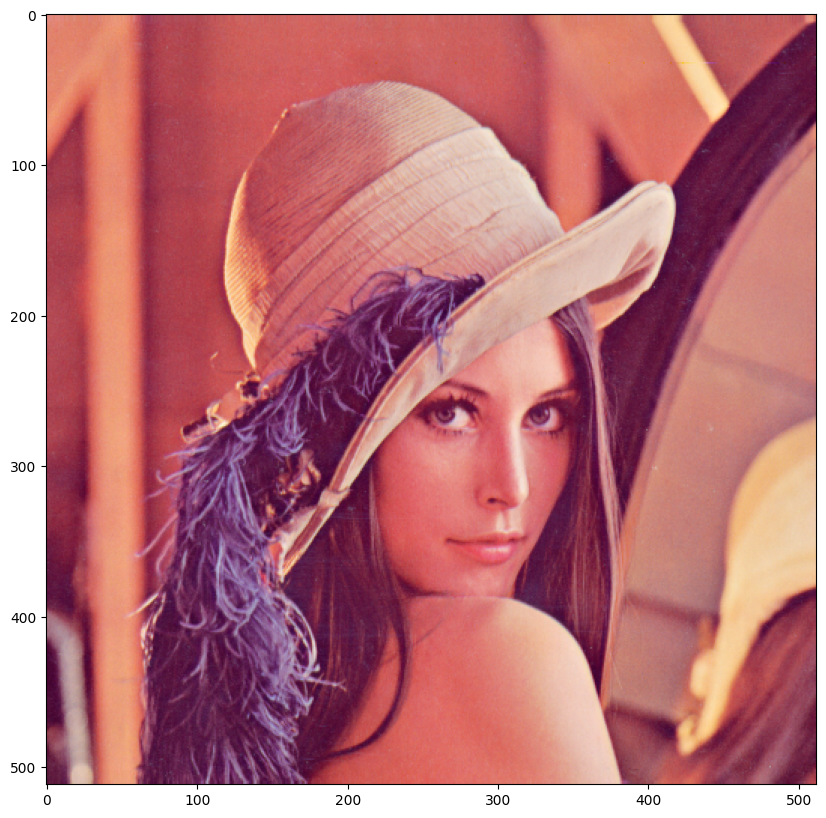

In [44]:
plt.figure(figsize=(10,10))
plt.imshow(array)

In [45]:
#  Usando o fatiamento numpy,
rows = 256

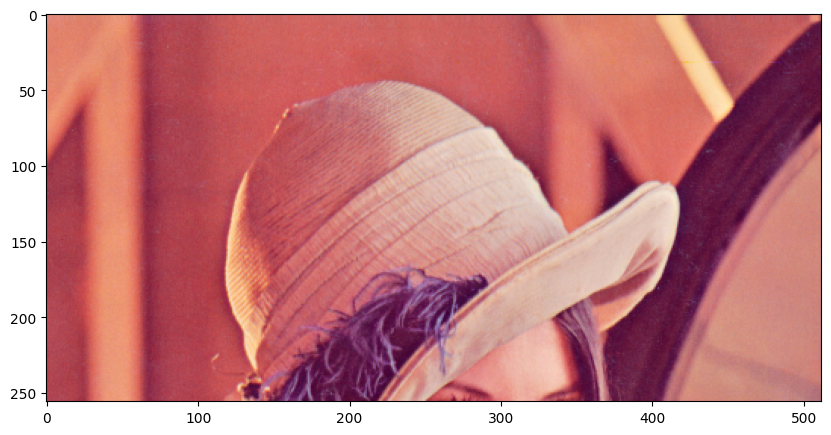

In [46]:
plt.figure(figsize=(10,10))
plt.imshow(array[0:rows,:,:])
plt.show()

In [49]:
columns = 256

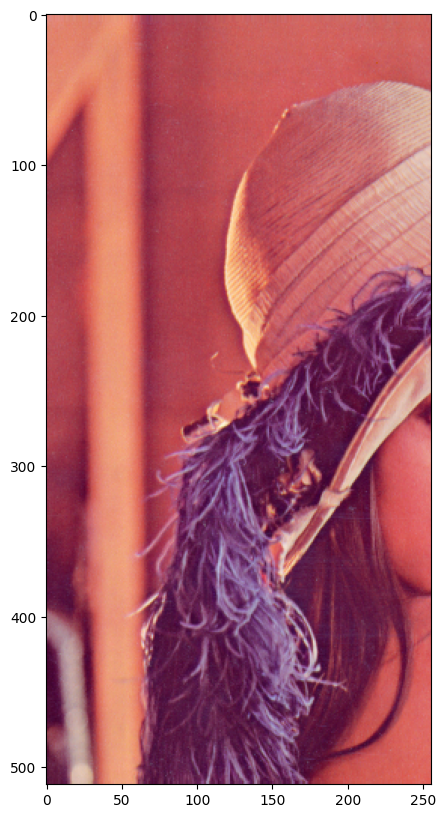

In [50]:
plt.figure(figsize=(10,10))
plt.imshow(array[:,0:columns,:])
plt.show()

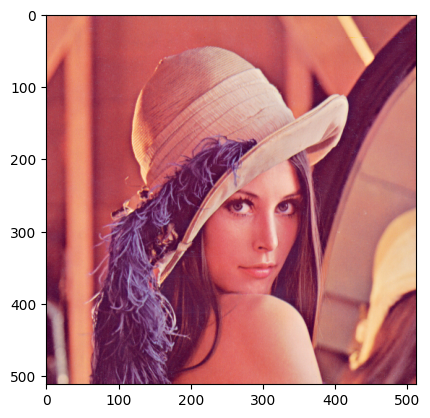

In [52]:
# reatribuir uma array para outra variável, deve usar o método copy
A = array.copy()
plt.imshow(A)
plt.show()

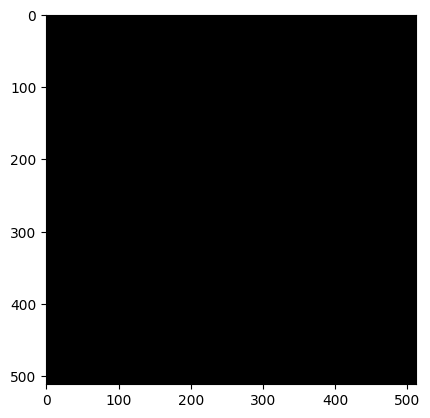

In [53]:
B = A
A[:,:,:] = 0
plt.imshow(B)
plt.show()


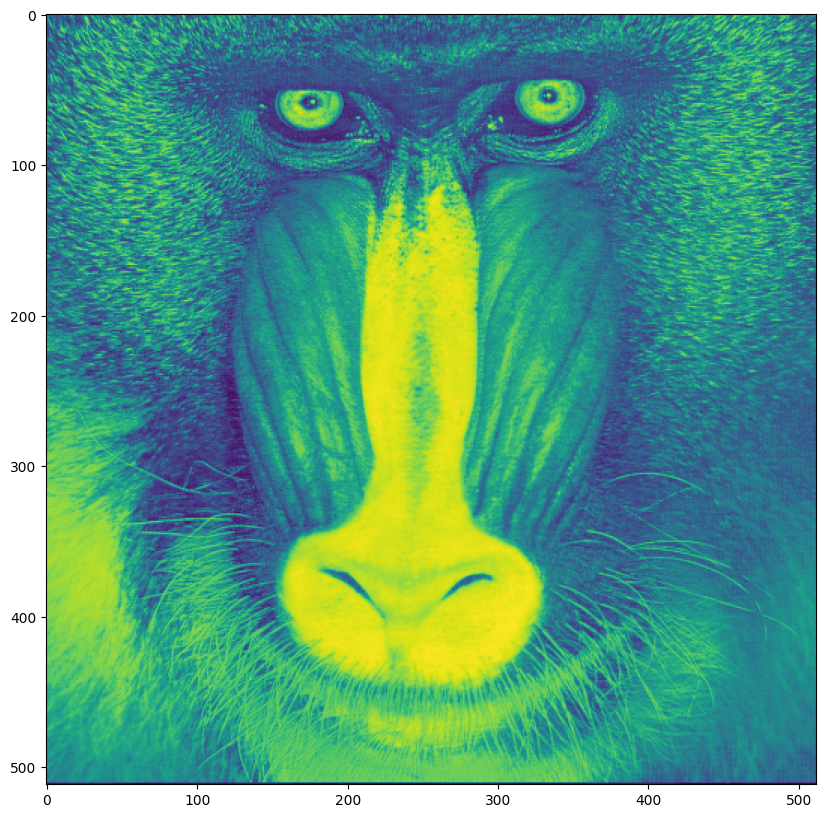

In [54]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array[:,:,0])
plt.show()

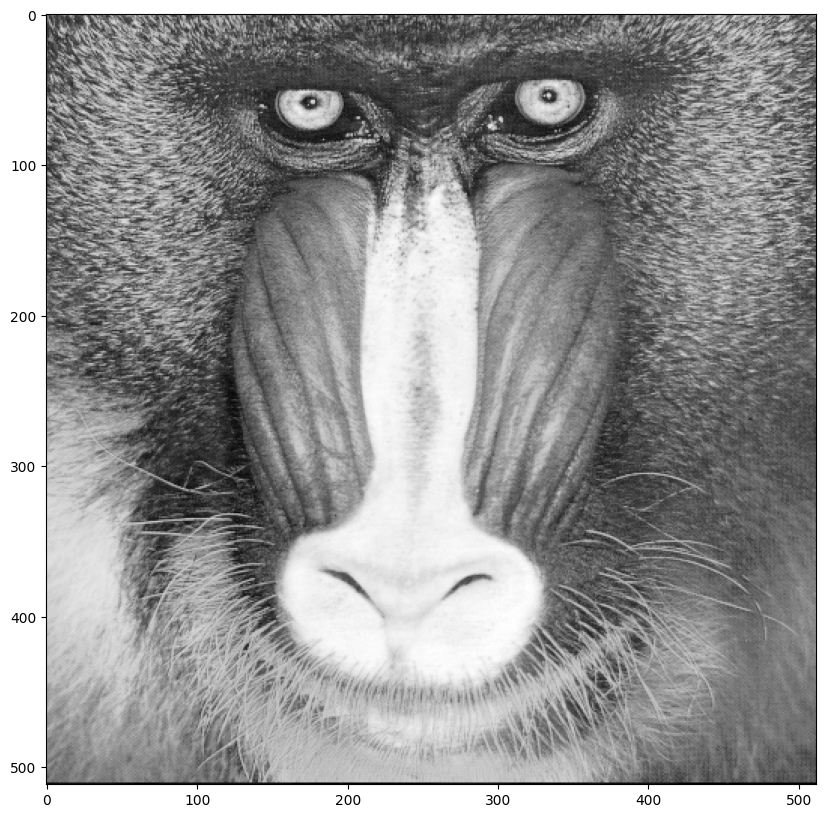

In [55]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array[:,:,0], cmap='gray')
plt.show()

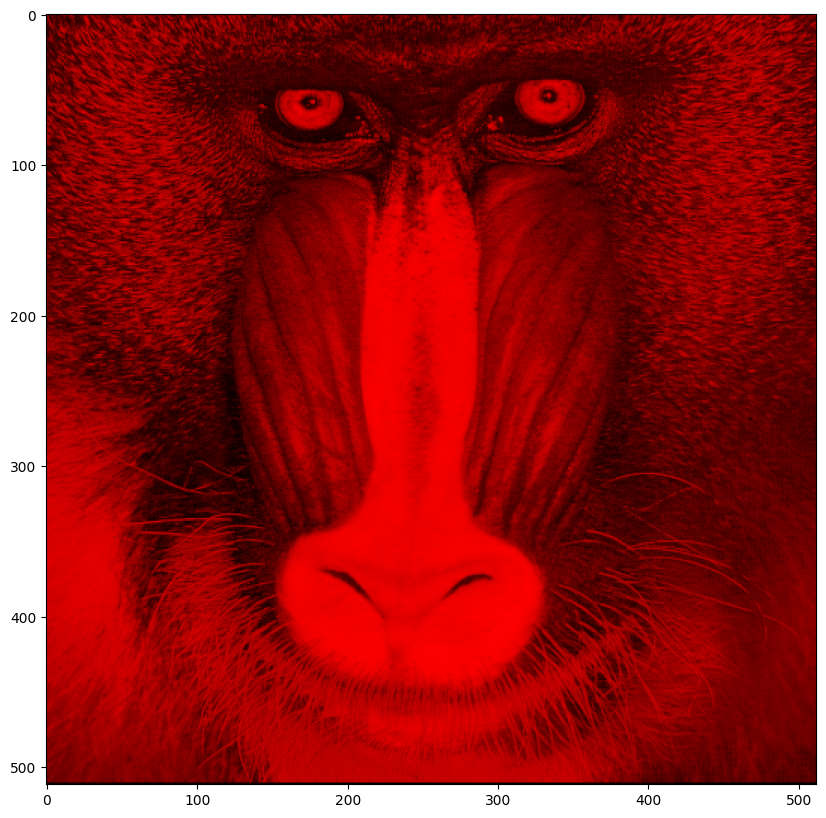

In [56]:
baboon_red=baboon_array.copy()
baboon_red[:,:,1] = 0
baboon_red[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_red)
plt.show()

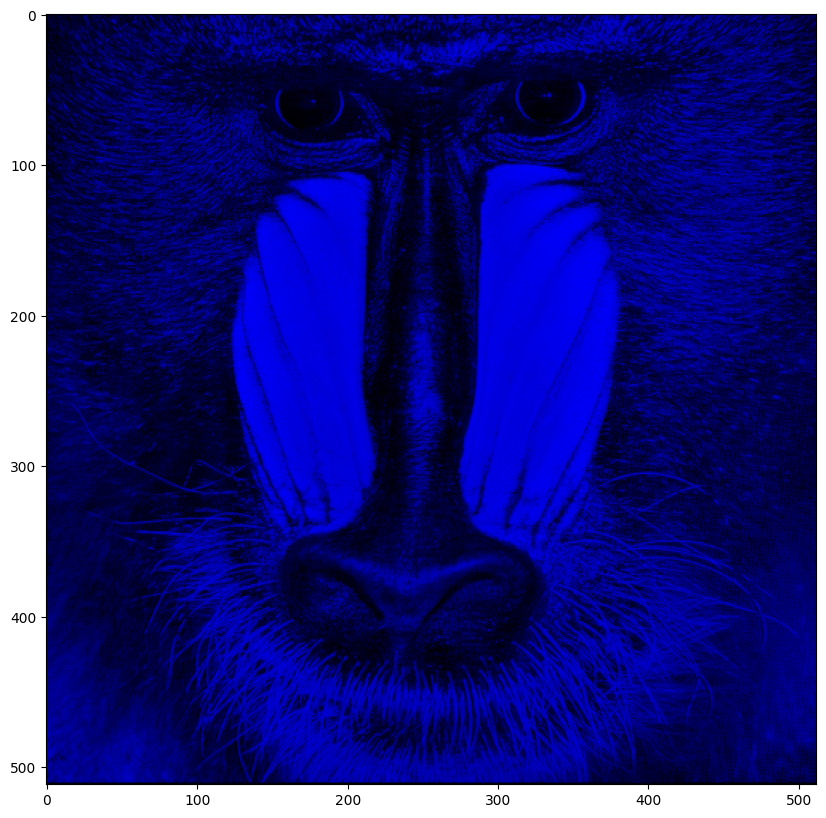

In [57]:
baboon_blue=baboon_array.copy()
baboon_blue[:,:,0] = 0
baboon_blue[:,:,1] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

Question 1:
Use the image lenna.png from this lab or take any image you like.

Open the image and create a PIL Image object called blue_lenna, convert the image into a numpy array we can manipulate called blue_array, get the blue channel out of it, and finally plot the image

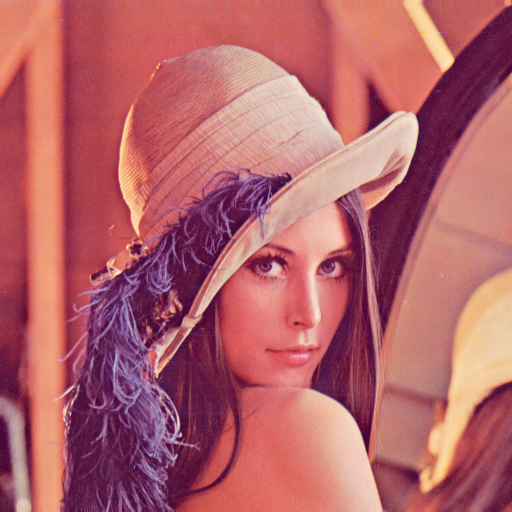

In [58]:
blue_lenna = Image.open('lenna.png')
blue_lenna

In [59]:
blue_array = np.asarray(image)
print(type(blue_array))

<class 'numpy.ndarray'>


In [60]:
blue_array = np.array(image)

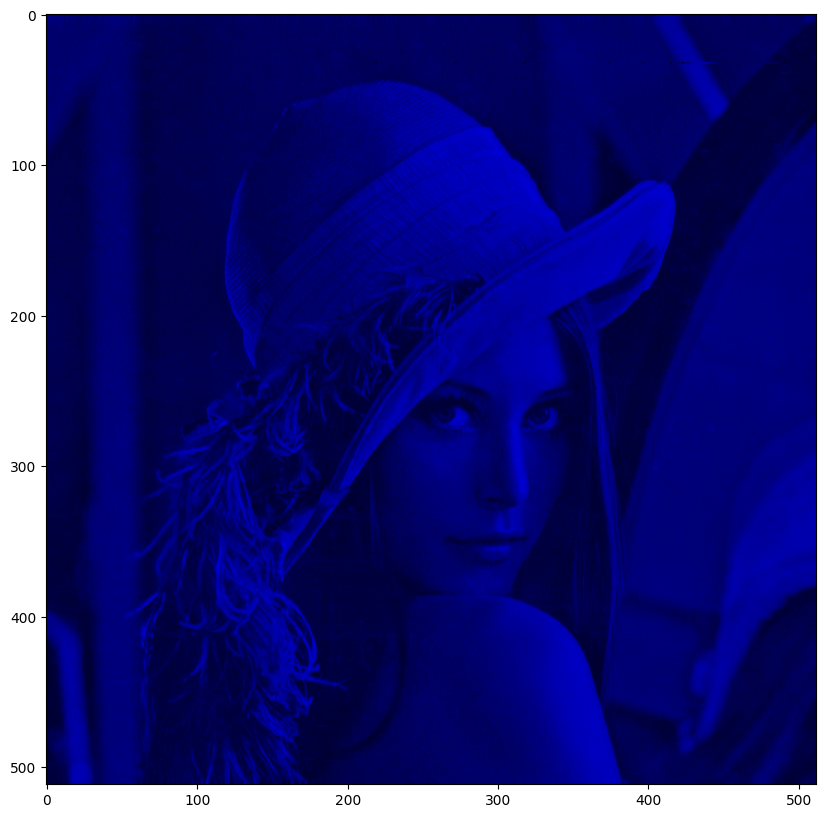

In [61]:
lenna_blue=blue_array.copy()
lenna_blue[:,:,0] = 0
lenna_blue[:,:,1] = 0
plt.figure(figsize=(10,10))
plt.imshow(lenna_blue)
plt.show()